<a href="https://colab.research.google.com/github/RamiroIsaJ/3.1.1_2flask/blob/main/EDA_Feature_Engineering_ML_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabajo final - Análisis de datos y visualización
## Presentado por: Ramiro Isa Jara
## Fecha: Julio 2026

### Objetivo del proyecto:

- Aplicar técnicas de EDA y de preprocesamiento de datos para el análisis predictivo.

- Uso de un dataset del repositorio: [UC Irvine Machine Learning Repository](https://archive.ics.uci.edu/).


## Parte 1: Descripción general del Dataset


A partir del archivo disponible en este enlace [https://archive.ics.uci.edu/dataset/16/breast+cancer+wisconsin+prognostic]

### Características del Dataset:

| Características | Área | Tareas asociadas | Tipo de datos | No. instancias | No. de carcterísticas |
| --- | --- | --- | --- | --- | --- |
| Multivariado | Salud - Medicina | Regresión y Clasificación | Real | 198 | 33 |

### Variables del Dataset:

| Nombre | Rol | Tipo | Valores perdidos |
| --- | --- | --- | --- |
| Time|	Feature	| Integer | no |
|radius1      |	Feature	|Continuous	|	no|
|texture1	    |Feature	|Continuous	|	no|
|perimeter1	  |Feature	|Continuous	|	no|
|area1	      |Feature	|Continuous	|	no|
|smoothness1	|Feature	|Continuous|	no|
|compactness1	|Feature	|Continuous|	no|
|concavity1	  |Feature	|Continuous|	no|
|concave_points1	|Feature	|Continuous|	no|
|symmetry1	|Feature	|Continuous|			no|
|fractal_dimension1	F|Feature	|Continuous	|		no|
|radius2	|Feature|	Continuous|			no|
|texture2	|Feature|	Continuous	|		no|
|perimeter2|	Feature|	Continuous|			no|
|area2	|Feature	|Continuous			|no|
|smoothness2	|Feature	|Continuous	|		no|
|compactness2	|Feature	|Continuous	|		no|
|concavity2	|Feature	|Continuous	|		no|
|concave_points2|	Feature|	Continuous|			no|
|symmetry2	|Feature	|Continuous			|no|
|fractal_dimension2	|Feature|	Continuous|			no|
|radius3	|Feature|	Continuous	|		no|
|texture3	|Feature	|Continuous		|	no|
|perimeter3|	Feature	|Continuous	|		no|
|area3	|Feature	|Integer		|	no|
|smoothness3	|Feature	|Continuous	|		no|
|compactness3	|Feature	|Continuous	|		no|
|concavity3	|Feature|	Continuous	|		no|
|concave_points3	|Feature	|Continuous	|		no|
|symmetry3|	Feature	|Continuous	|		no|
|fractal_dimension3	|Feature |	Continuous	|		no |
|tumor_size |	Feature / Target	|Continuous	|		no|
|lymph_node_status	|Feature / Target	|Integer|			no|
|Outcome	|Target|	Categorical	|		no|

In [ ]:
# Carga de librerías
# import kaggle
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import itertools
import time
import seaborn as sns
from copy import deepcopy
from IPython.core import display as ICD
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Parte 1.1: Carga del dataset desde el archivo CSV

In [ ]:
#Cargar lista de palabras clave:
path = '/content/drive/MyDrive/Analisis_datos_UTPL/Trabajos/'

data = pd.read_csv(path+'data_breast_cancer.csv', delimiter=',', encoding='unicode_escape')
data.sample(10)

,Id,Time,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,...,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size,lymph_node_status,Outcome
153,9113538,N,32,17.60,23.33,119.00,980.5,0.09289,0.20040,0.21360,...,143.6,1437.0,0.1207,0.4785,0.5165,0.19960,0.2301,0.12240,1.0,0
85,877500,N,72,14.45,20.22,94.49,642.7,0.09872,0.12060,0.11800,...,117.9,1044.0,0.1552,0.4056,0.4967,0.18380,0.4753,0.10130,1.5,?
13,847990,R,36,14.54,27.54,96.73,658.8,0.11390,0.15950,0.16390,...,124.1,943.2,0.1678,0.6577,0.7026,0.17120,0.4218,0.13410,6.0,6
17,851509,R,10,21.16,23.04,137.20,1404.0,0.09428,0.10220,0.10970,...,188.0,2615.0,0.1401,0.2600,0.3155,0.20090,0.2822,0.07526,4.0,1
146,908445,N,47,18.82,21.97,123.70,1110.0,0.10180,0.13890,0.15940,...,145.3,1603.0,0.1390,0.3463,0.3912,0.17080,0.3007,0.08314,1.0,0
10,845636,N,123,16.02,23.24,102.70,797.8,0.08206,0.06669,0.03299,...,123.8,1150.0,0.1181,0.1551,0.1459,0.09975,0.2948,0.08452,2.0,0
81,875263,R,74,12.34,26.86,81.15,477.4,0.10340,0.13530,0.10850,...,101.7,768.9,0.1785,0.4706,0.4425,0.14590,0.3215,0.12050,1.2,4
2,842517,N,116,21.37,17.44,137.50,1373.0,0.08836,0.11890,0.12550,...,159.1,1949.0,0.1188,0.3449,0.3414,0.20320,0.4334,0.09067,2.5,0
168,925622,N,30,15.22,30.62,103.40,716.9,0.10480,0.20870,0.25500,...,128.7,915.0,0.1417,0.7917,1.1700,0.23560,0.4089,0.14090,2.5,0
102,88607,N,76,17.30,17.08,113.00,928.2,0.10080,0.10410,0.12660,...,130.9,1222.0,0.1416,0.2405,0.3378,0.18570,0.3138,0.08113,1.2,0


## Parte 2: Aplicación de EDA para el dataset

### Paso 2.1: Exploración de las variables

Para tener una idea inicial, se explora el dataset mostrando un resumen general de sus atributos.

In [ ]:
print('Dimensión del dataset: ', data.shape, "\n")
data.info()

Dimensión del dataset:  (198, 35) 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198 entries, 0 to 197
Data columns (total 35 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  198 non-null    int64  
 1   Time                198 non-null    object 
 2   radius1             198 non-null    int64  
 3   texture1            198 non-null    float64
 4   perimeter1          198 non-null    float64
 5   area1               198 non-null    float64
 6   smoothness1         198 non-null    float64
 7   compactness1        198 non-null    float64
 8   concavity1          198 non-null    float64
 9   concave_points1     198 non-null    float64
 10  symmetry1           198 non-null    float64
 11  fractal_dimension1  198 non-null    float64
 12  radius2             198 non-null    float64
 13  texture2            198 non-null    float64
 14  perimeter2          198 non-null    float64
 15  area2               1

### Paso 2.2: Eliminación de atributos

Se eliminan atributos o columnas del dataframe que no aporten significancia a la información para generar el modelo predictivo. En este caso se elimina la variable *ID*, *Time* y *Outcome*.

**La variable *Outcome* se elimina porque el modelo que se va a generar es de regresión y no de clasificación.**

In [ ]:
data = data.drop(columns=['Id', 'Time', 'Outcome'])
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198 entries, 0 to 197
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             198 non-null    int64  
 1   texture1            198 non-null    float64
 2   perimeter1          198 non-null    float64
 3   area1               198 non-null    float64
 4   smoothness1         198 non-null    float64
 5   compactness1        198 non-null    float64
 6   concavity1          198 non-null    float64
 7   concave_points1     198 non-null    float64
 8   symmetry1           198 non-null    float64
 9   fractal_dimension1  198 non-null    float64
 10  radius2             198 non-null    float64
 11  texture2            198 non-null    float64
 12  perimeter2          198 non-null    float64
 13  area2               198 non-null    float64
 14  smoothness2         198 non-null    float64
 15  compactness2        198 non-null    float64
 16  concavit

### Paso 2.3: Visualización y análisis de los datos

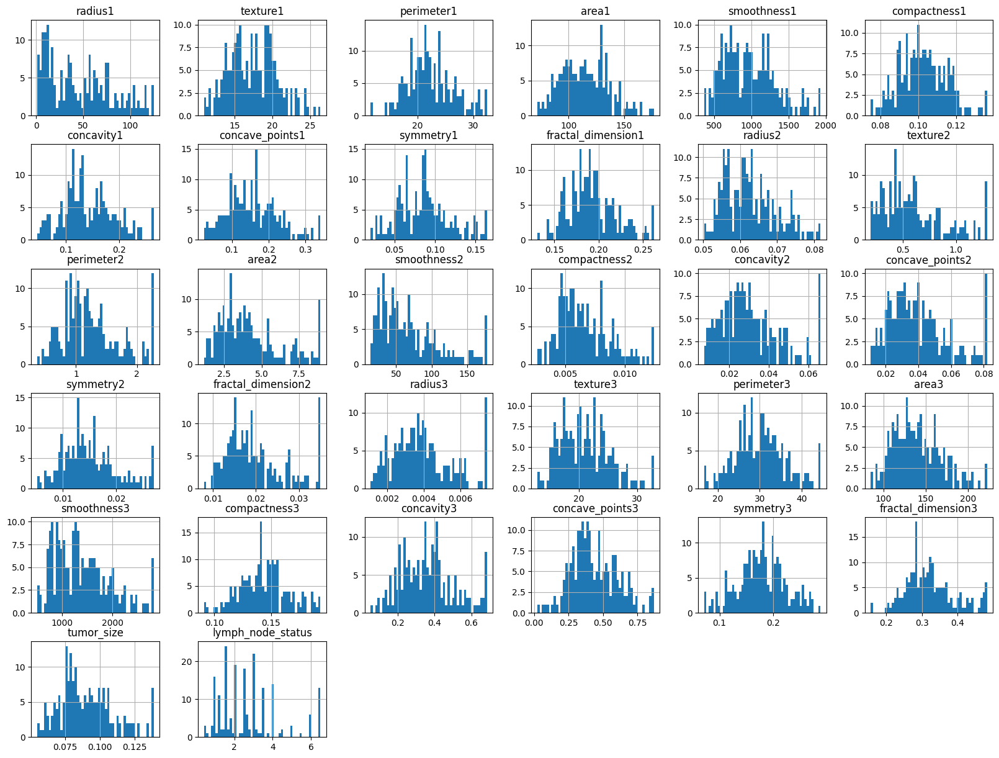

In [ ]:
# seleccionar los parametros numericos del dataset para aplicacion de EDA
data_num = data.select_dtypes(include=['float', 'int'])
data_num.hist(bins=50, figsize=(20,15))
plt.show()

In [ ]:
sns.pairplot(data_num)

### Primera CONCLUSION

Se puede notar que las variables presentan diferentes tendencias durante el análisis de correlación.

Por tanto se puede concluir que los datos provienen de un analisis real referido a la enfermedad.

In [ ]:
# Analisis de los datos a nivel estadístico
print(data.describe())


          radius1    texture1  perimeter1       area1  smoothness1  \
count  198.000000  198.000000   198.00000  198.000000   198.000000   
mean    46.732323   17.412323    22.27601  114.856566   970.040909   
std     34.462870    3.161676     4.29829   21.383402   352.149215   
min      1.000000   10.950000    10.38000   71.900000   361.600000   
25%     14.000000   15.052500    19.41250   98.160000   702.525000   
50%     39.500000   17.290000    21.75000  113.700000   929.100000   
75%     72.750000   19.580000    24.65500  129.650000  1193.500000   
max    125.000000   27.220000    39.28000  182.100000  2250.000000   

       compactness1  concavity1  concave_points1   symmetry1  \
count    198.000000  198.000000       198.000000  198.000000   
mean       0.102681    0.142648         0.156243    0.086776   
std        0.012522    0.049898         0.070572    0.033877   
min        0.074970    0.046050         0.023980    0.020310   
25%        0.093900    0.110200         0.106850 

### Parte 2.4: Revisión de la distribución de los datos

Revisón para analizar las distribuciones de cada unas de las variables del dataset y verificar si exiten valores atípicos y/o valores NAN.

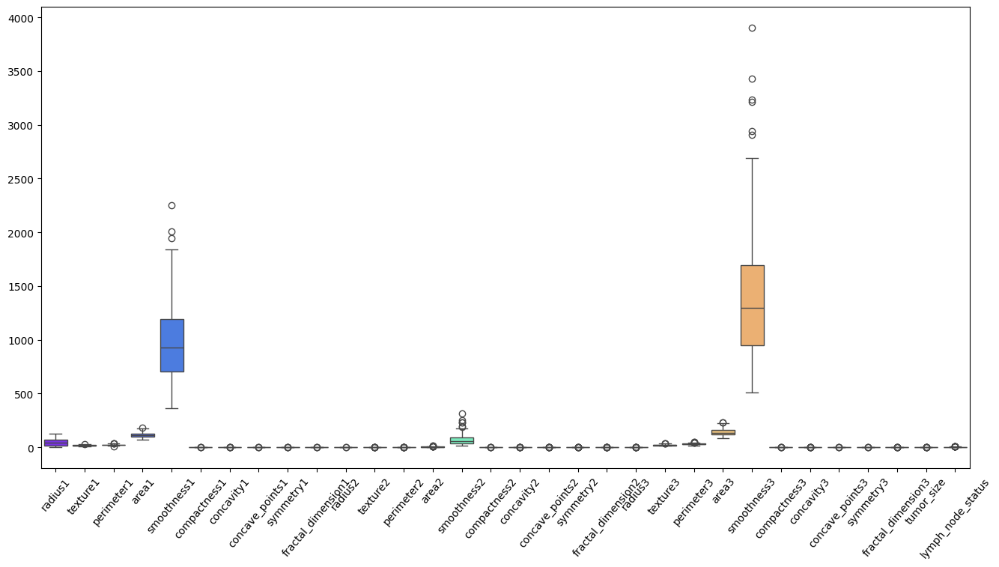

Analisis de cantidad de valores no numéricos
radius1               0
texture1              0
perimeter1            0
area1                 0
smoothness1           0
compactness1          0
concavity1            0
concave_points1       0
symmetry1             0
fractal_dimension1    0
radius2               0
texture2              0
perimeter2            0
area2                 0
smoothness2           0
compactness2          0
concavity2            0
concave_points2       0
symmetry2             0
fractal_dimension2    0
radius3               0
texture3              0
perimeter3            0
area3                 0
smoothness3           0
compactness3          0
concavity3            0
concave_points3       0
symmetry3             0
fractal_dimension3    0
tumor_size            0
lymph_node_status     0
dtype: int64


In [ ]:
# Tratamiento de datos numericos
plt.figure(figsize=(16,8))
sns.boxplot(data=data, palette='rainbow')
plt.xticks(rotation=50)
plt.show()

# revision de valores NAN
print('Analisis de cantidad de valores no numéricos')
print(data.isna().sum())

### Paso 2.5: Preparación de los datos

Se realiza el tratamiento de los datos atípicos y se analiza las características univariantes y bivariantes de las variables del dataset.

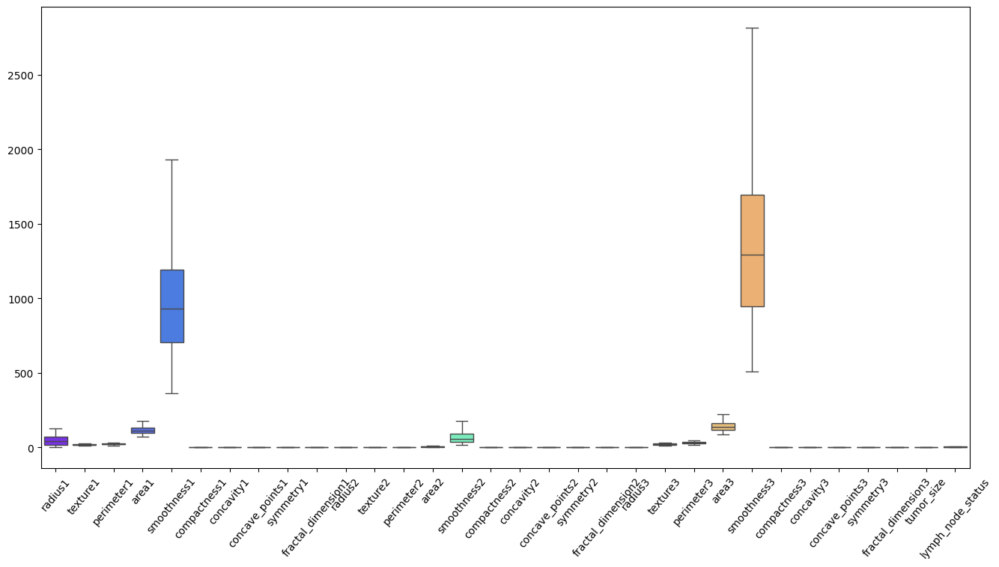

In [ ]:
# Tratamiento de datos atípicos
for col in data:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    data[col] = data[col].clip(lower, upper)

plt.figure(figsize=(16,8))
sns.boxplot(data=data, palette='rainbow')
plt.xticks(rotation=50)
plt.show()

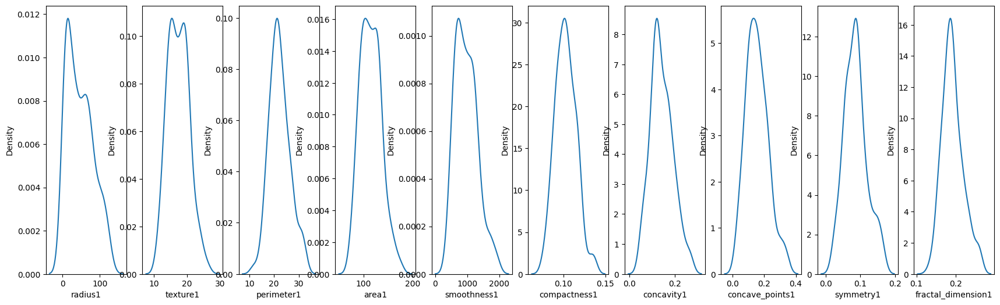

In [ ]:
# Grafico de densidad univariante
fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(21, 6))

sns.kdeplot(data=data_num, x="radius1", ax=axes[0])
sns.kdeplot(data=data_num, x="texture1", ax=axes[1])
sns.kdeplot(data=data_num, x="perimeter1", ax=axes[2])
sns.kdeplot(data=data_num, x="area1", ax=axes[3])
sns.kdeplot(data=data_num, x="smoothness1", ax=axes[4])
sns.kdeplot(data=data_num, x="compactness1", ax=axes[5])
sns.kdeplot(data=data_num, x="concavity1", ax=axes[6])
sns.kdeplot(data=data_num, x="concave_points1", ax=axes[7])
sns.kdeplot(data=data_num, x="symmetry1", ax=axes[8])
sns.kdeplot(data=data_num, x="fractal_dimension1", ax=axes[9])
plt.show()

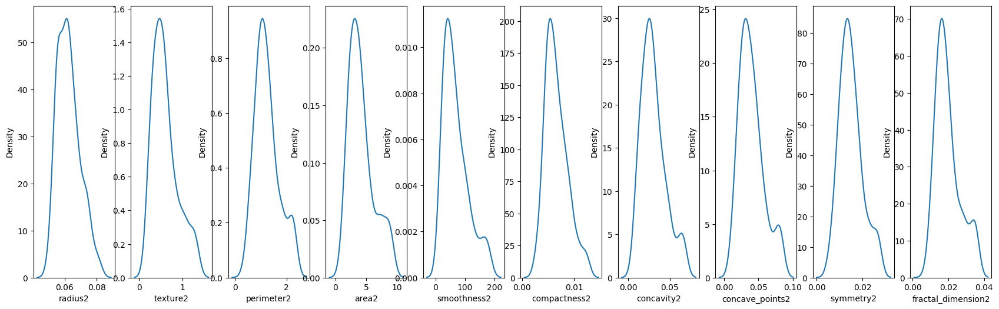

In [ ]:
# Grafico de densidad univariante
fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(21, 6))

sns.kdeplot(data=data_num, x="radius2", ax=axes[0])
sns.kdeplot(data=data_num, x="texture2", ax=axes[1])
sns.kdeplot(data=data_num, x="perimeter2", ax=axes[2])
sns.kdeplot(data=data_num, x="area2", ax=axes[3])
sns.kdeplot(data=data_num, x="smoothness2", ax=axes[4])
sns.kdeplot(data=data_num, x="compactness2", ax=axes[5])
sns.kdeplot(data=data_num, x="concavity2", ax=axes[6])
sns.kdeplot(data=data_num, x="concave_points2", ax=axes[7])
sns.kdeplot(data=data_num, x="symmetry2", ax=axes[8])
sns.kdeplot(data=data_num, x="fractal_dimension2", ax=axes[9])
plt.show()

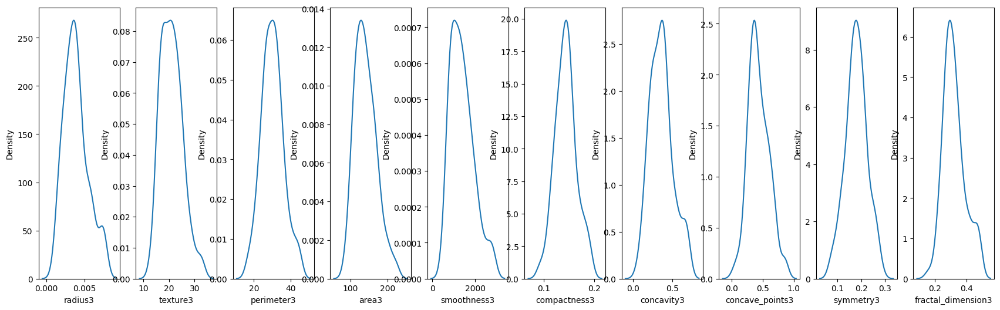

In [ ]:
# Grafico de densidad univariante
fig, axes = plt.subplots(nrows=1, ncols=10, figsize=(21, 6))

sns.kdeplot(data=data_num, x="radius3", ax=axes[0])
sns.kdeplot(data=data_num, x="texture3", ax=axes[1])
sns.kdeplot(data=data_num, x="perimeter3", ax=axes[2])
sns.kdeplot(data=data_num, x="area3", ax=axes[3])
sns.kdeplot(data=data_num, x="smoothness3", ax=axes[4])
sns.kdeplot(data=data_num, x="compactness3", ax=axes[5])
sns.kdeplot(data=data_num, x="concavity3", ax=axes[6])
sns.kdeplot(data=data_num, x="concave_points3", ax=axes[7])
sns.kdeplot(data=data_num, x="symmetry3", ax=axes[8])
sns.kdeplot(data=data_num, x="fractal_dimension3", ax=axes[9])
plt.show()

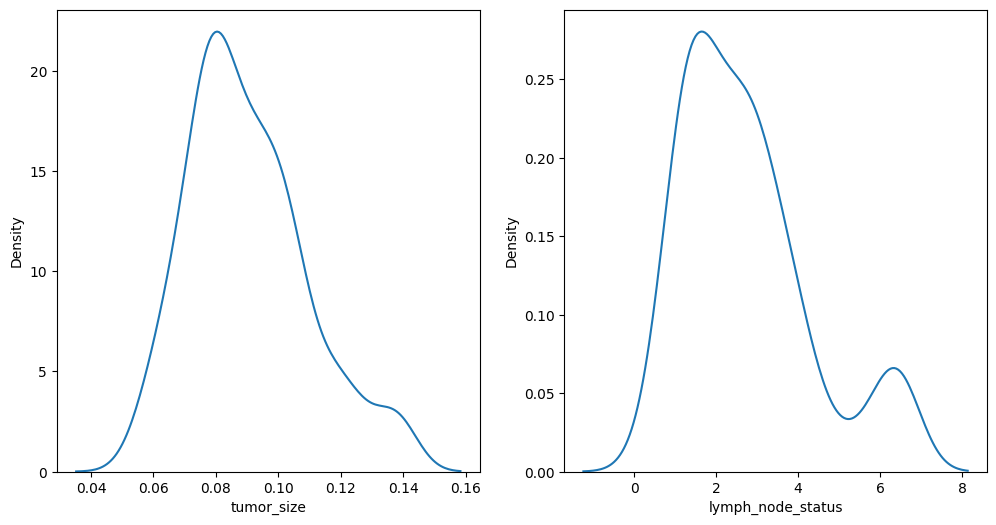

In [ ]:
# Grafico de densidad univariante
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

sns.kdeplot(data=data_num, x="tumor_size", ax=axes[0])
sns.kdeplot(data=data_num, x="lymph_node_status", ax=axes[1])

plt.show()

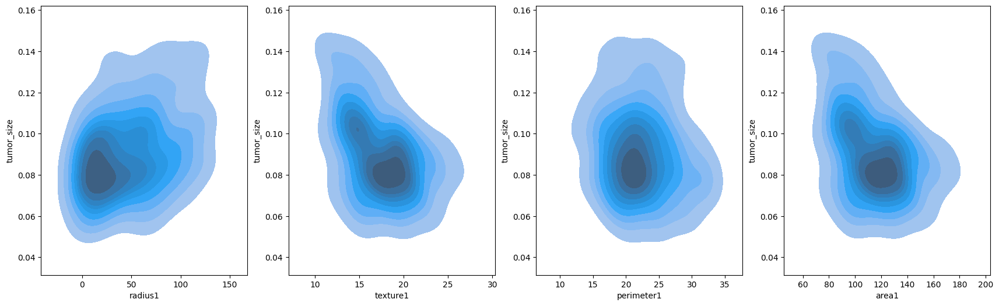

In [ ]:
# Grafico de densidad bivariante
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(21, 6))

sns.kdeplot(data=data_num, x="radius1", y="tumor_size", fill=True, ax=axes[0])
sns.kdeplot(data=data_num, x="texture1", y="tumor_size", fill=True, ax=axes[1])
sns.kdeplot(data=data_num, x="perimeter1", y="tumor_size", fill=True, ax=axes[2])
sns.kdeplot(data=data_num, x="area1", y="tumor_size", fill=True, ax=axes[3])
plt.show()

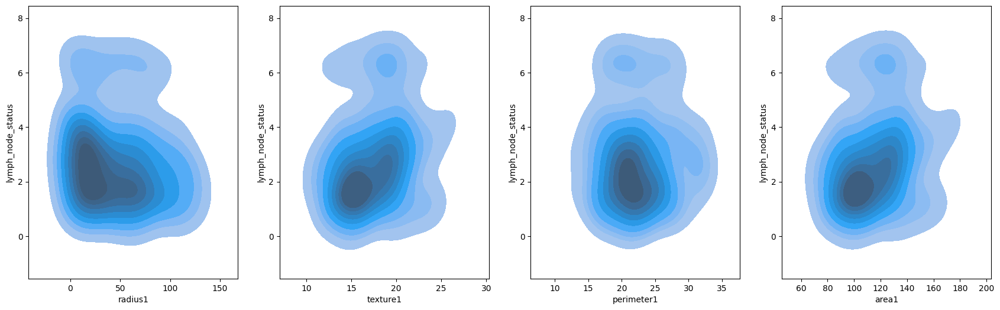

In [ ]:
# Grafico de densidad bivariante
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(21, 6))

sns.kdeplot(data=data_num, x="radius1", y="lymph_node_status", fill=True, ax=axes[0])
sns.kdeplot(data=data_num, x="texture1", y="lymph_node_status", fill=True, ax=axes[1])
sns.kdeplot(data=data_num, x="perimeter1", y="lymph_node_status", fill=True, ax=axes[2])
sns.kdeplot(data=data_num, x="area1", y="lymph_node_status", fill=True, ax=axes[3])
plt.show()

### Paso 2.6: Feature engineering

Analizar si las variables dependientes (predichas) `y` (tumor_size, lymph_node_status) tiene relaciones lineales con algunas variables independientes o predictoras.

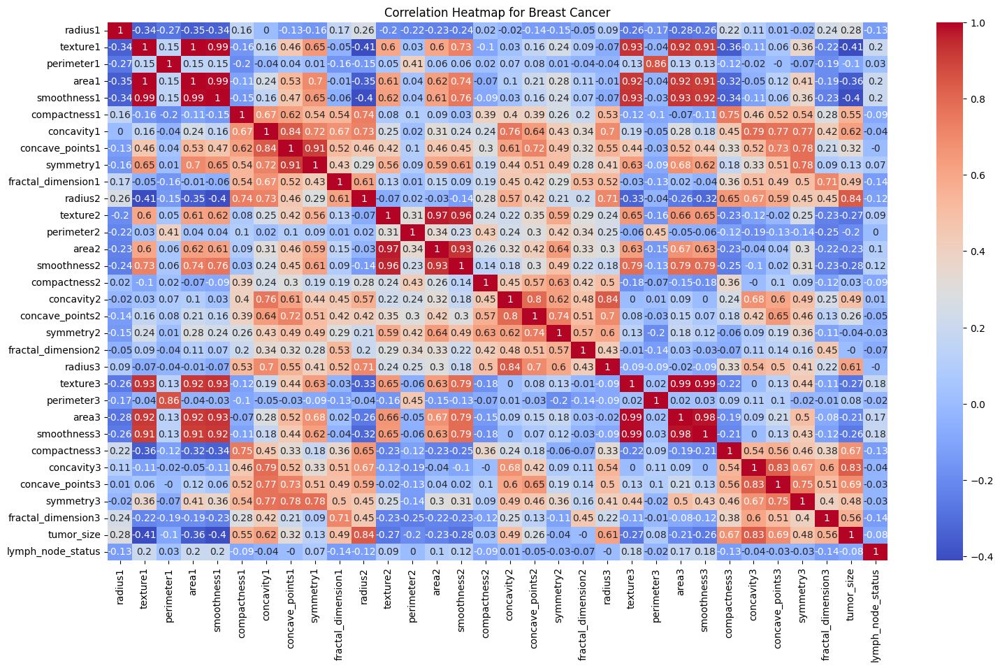

In [ ]:
np.random.seed(42)

corr_matrix = np.round(data_num.corr(), 2)
plt.figure(figsize=(18, 10))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap for Breast Cancer")
plt.show()

In [ ]:
# Analisis de correlaciones con la variable a predicir tumor_size
correlation1 = data.corr(); correlation1['tumor_size']

,tumor_size
radius1,0.283117
texture1,-0.412086
perimeter1,-0.099233
area1,-0.359645
smoothness1,-0.399771
compactness1,0.545022
concavity1,0.623047
concave_points1,0.319252
symmetry1,0.125107
fractal_dimension1,0.485562


## Verificar la correlación en el rango (-0.3, 0.3)

In [ ]:
correlation1['tumor_size'][(correlation1['tumor_size'].abs() >= -0.3) & (correlation1['tumor_size'].abs() <= 0.3)]

,tumor_size
radius1,0.283117
perimeter1,-0.099233
symmetry1,0.125107
texture2,-0.269657
perimeter2,-0.198399
area2,-0.231422
smoothness2,-0.283166
compactness2,0.030798
concave_points2,0.259712
symmetry2,-0.037916


## Eliminación de parámetros predictivos en base al análisis de correlaciones

In [ ]:
X_previo = deepcopy(data_num)

X_previo = X_previo.drop(columns=['radius1','perimeter1', 'symmetry1', 'texture2','perimeter2', 'area2',
                                  'compactness2', 'smoothness2', 'concave_points2', 'texture3', 'area3',
                                  'symmetry2', 'fractal_dimension2', 'perimeter3', 'smoothness3', 'lymph_node_status'])
X_previo.head()

,texture1,area1,smoothness1,compactness1,concavity1,concave_points1,fractal_dimension1,radius2,concavity2,radius3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size
0,18.02,117.50,1013.0,0.094890,0.1036,0.1086,0.1865,0.063330,0.014210,0.003495,0.1195,0.192600,0.3140,0.1170,0.267700,0.081130
1,17.99,122.80,1001.0,0.118400,0.2652,0.3001,0.2419,0.078710,0.049040,0.006193,0.1622,0.665600,0.7119,0.2654,0.460100,0.118900
2,21.37,137.50,1373.0,0.088360,0.1189,0.1255,0.2333,0.060100,0.034490,0.005039,0.1188,0.344900,0.3414,0.2032,0.433400,0.090670
3,11.42,77.58,386.1,0.136588,0.2652,0.2414,0.2597,0.081711,0.066134,0.007452,0.1932,0.686138,0.6869,0.2575,0.483075,0.138571
4,20.29,135.10,1297.0,0.100300,0.1328,0.1980,0.1809,0.058830,0.024610,0.005115,0.1374,0.205000,0.4000,0.1625,0.236400,0.076780


### Análisis de correlaciones de las variables predictoras

<Axes: >

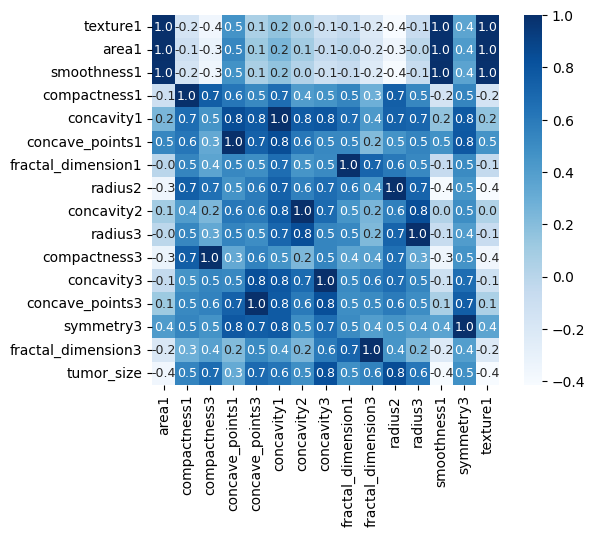

In [ ]:
correlationX1 = X_previo.corr()

corrX1 = correlationX1[correlationX1.columns.difference(['tumor_size'])]

sns.heatmap(corrX1, cbar=True, square=True, fmt='.1f', annot=True, annot_kws={'size':9}, cmap='Blues')

### Análisis de variables altamente correlacionadas (cor > 0.7)

- texture1 - smoothness1 y texture1 (1)
- area1 - smoothness1 y texture1 (1)
- concavity1 - concave_points1, concavity3, symmetry3 (0.8)
- concavity2 - radius3 (0.8)
- concavity3 - concave_points3, concavity1 (0.8)
- symmetry3 - concave_points1, concavity1 (0.8)

Por tanto, se eliminan las variables:
- *smoothness1, texture1, concavity1, concave_points*

In [ ]:
X_previo = X_previo.drop(columns=['smoothness1', 'texture1', 'concavity1', 'concave_points1'])
X_previo.head()

,area1,compactness1,fractal_dimension1,radius2,concavity2,radius3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size
0,117.50,0.094890,0.1865,0.063330,0.014210,0.003495,0.1195,0.192600,0.3140,0.1170,0.267700,0.081130
1,122.80,0.118400,0.2419,0.078710,0.049040,0.006193,0.1622,0.665600,0.7119,0.2654,0.460100,0.118900
2,137.50,0.088360,0.2333,0.060100,0.034490,0.005039,0.1188,0.344900,0.3414,0.2032,0.433400,0.090670
3,77.58,0.136588,0.2597,0.081711,0.066134,0.007452,0.1932,0.686138,0.6869,0.2575,0.483075,0.138571
4,135.10,0.100300,0.1809,0.058830,0.024610,0.005115,0.1374,0.205000,0.4000,0.1625,0.236400,0.076780


## Definición de las variables predictoras X y la variable a predecir tumor_size

In [ ]:
dataf = deepcopy(X_previo)

print(dataf.shape)
# variables predictoras
X1 = dataf[['area1', 'compactness1', 'fractal_dimension1', 'radius2',	'concavity2',
            'radius3',	'compactness3',	'concavity3',	'concave_points3',
            'symmetry3',	'fractal_dimension3']]
print(X1.head())
# variables a predicir
y1 = dataf[['tumor_size']]


(198, 12)
    area1  compactness1  fractal_dimension1   radius2  concavity2   radius3  \
0  117.50      0.094890              0.1865  0.063330    0.014210  0.003495   
1  122.80      0.118400              0.2419  0.078710    0.049040  0.006193   
2  137.50      0.088360              0.2333  0.060100    0.034490  0.005039   
3   77.58      0.136588              0.2597  0.081711    0.066134  0.007452   
4  135.10      0.100300              0.1809  0.058830    0.024610  0.005115   

   compactness3  concavity3  concave_points3  symmetry3  fractal_dimension3  
0        0.1195    0.192600           0.3140     0.1170            0.267700  
1        0.1622    0.665600           0.7119     0.2654            0.460100  
2        0.1188    0.344900           0.3414     0.2032            0.433400  
3        0.1932    0.686138           0.6869     0.2575            0.483075  
4        0.1374    0.205000           0.4000     0.1625            0.236400  


## Analisis de Multicolinealidad

Se usa el método de VIF (variance_inflaction_factor)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

#  Calcular the VIF para todo el dataset (X)

vifF1 = pd.DataFrame()

vifF1["features"] = X1.columns
vifF1["vif_Factor"] = [variance_inflation_factor(X1, i) for i in range(X1.shape[1])]
print(vifF1)

              features  vif_Factor
0                area1   36.798303
1         compactness1  329.974457
2   fractal_dimension1  209.237512
3              radius2  282.869609
4           concavity2   29.685326
5              radius3   33.758369
6         compactness3  167.836495
7           concavity3   45.933519
8      concave_points3   34.176398
9            symmetry3   66.354474
10  fractal_dimension3   79.742053


In [ ]:
#  Calcular the VIF con eliminación de features

vifF2 = pd.DataFrame()

x_DF2 = X1.drop('compactness1', axis=1)
x_DF2.head()

vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

             features  vif_Factor
0               area1   36.726540
1  fractal_dimension1  191.939468
2             radius2  222.551172
3          concavity2   29.282015
4             radius3   33.653575
5        compactness3  109.731706
6          concavity3   42.688987
7     concave_points3   34.141287
8           symmetry3   63.204283
9  fractal_dimension3   75.115037


In [ ]:
x_DF2 = x_DF2.drop('radius2', axis=1)
x_DF2.head()

vifF2 = pd.DataFrame()
vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

             features  vif_Factor
0               area1   34.667439
1  fractal_dimension1  157.114356
2          concavity2   29.192935
3             radius3   30.545544
4        compactness3   50.256416
5          concavity3   41.201635
6     concave_points3   33.697131
7           symmetry3   60.686177
8  fractal_dimension3   74.910370


In [ ]:
x_DF2 = x_DF2.drop('fractal_dimension1', axis=1)
x_DF2.head()

vifF2 = pd.DataFrame()
vifF2["features"] = x_DF2.columns
vifF2["vif_Factor"] = [variance_inflation_factor(x_DF2.values, i) for i in range(x_DF2.shape[1])]
print(vifF2)

             features  vif_Factor
0               area1   29.554389
1          concavity2   29.096842
2             radius3   27.076587
3        compactness3   42.406813
4          concavity3   39.667803
5     concave_points3   33.085173
6           symmetry3   59.929652
7  fractal_dimension3   31.659041


### 3. Análisis predictivo

A continuación, se aplicará los algoritmos de regresión lineal para modelar las variables predictoras seleccionadas en el análisis anterior y predicir la variable **tumor_size**.

In [ ]:
# dataset final de las features predictoras seleccionadas

data_f = X_previo.drop(columns=['compactness1', 'radius2', 'fractal_dimension1'])
data_f.head()

,area1,concavity2,radius3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size
0,117.50,0.014210,0.003495,0.1195,0.192600,0.3140,0.1170,0.267700,0.081130
1,122.80,0.049040,0.006193,0.1622,0.665600,0.7119,0.2654,0.460100,0.118900
2,137.50,0.034490,0.005039,0.1188,0.344900,0.3414,0.2032,0.433400,0.090670
3,77.58,0.066134,0.007452,0.1932,0.686138,0.6869,0.2575,0.483075,0.138571
4,135.10,0.024610,0.005115,0.1374,0.205000,0.4000,0.1625,0.236400,0.076780


## 3.1 Regresión lineal simple usando la variable que mayor correlación presente con la variable tumor_size

In [ ]:
correlation2 = data_f.corr(); correlation2['tumor_size']

,tumor_size
area1,-0.359645
concavity2,0.485173
radius3,0.613964
compactness3,0.669224
concavity3,0.826940
concave_points3,0.685099
symmetry3,0.477675
fractal_dimension3,0.555946
tumor_size,1.000000


### La variable que tiene la más alta correlación es *concavity3*

A continuación se grafica la variable y se analizan los test de hipótesis respectivos: test de normalidad de los datos y test de homocedasticidad.

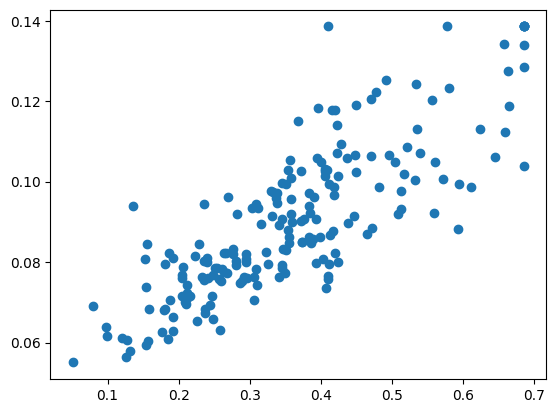

In [ ]:
plt.plot(data_f['concavity3'], data_f['tumor_size'], 'o')

In [ ]:
# División del conjunto de entrenamiento

from sklearn.model_selection import train_test_split

X = data_f[['concavity3']]
y = data_f[['tumor_size']]

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle = True, random_state=42)

In [ ]:
# modelo de regresión lineal simple

from sklearn.linear_model import LinearRegression

regresion_lineal = LinearRegression()

regresion_lineal.fit(x_train, y_train)


LinearRegression()

In [ ]:
# Parámetros que ha estimado la regresión lineal:
print('a = ' + str(regresion_lineal.intercept_) , ' b = ' + str(regresion_lineal.coef_) )

a = [0.05169463]  b = [[0.10692859]]


### Interpretación de los coeficientes:

- Cuando `x` es 0, `y` vale 0,05. Este parámetro se lo conoce como *Intercepto*
- `y` sube 0.11 unidades por cada unidad que sube `x`. Este parámetro es la *pendiente* del modelo lineal.

Text(0, 0.5, 'tumor_size')

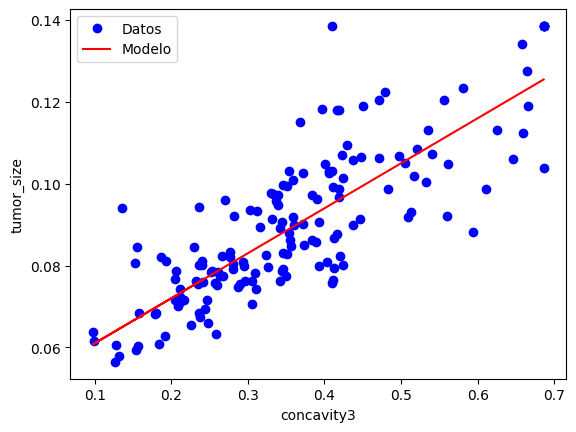

In [ ]:
y_model = 0.05 + 0.11*x_train

plt.plot(x_train, y_train, 'ob')
plt.plot(x_train, y_model, '-r')
plt.legend(['Datos', 'Modelo'])
plt.xlabel('concavity3')
plt.ylabel('tumor_size')

### 3.2 Utilización del modelo para predicción y evaluación del modelo

In [ ]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

y_predict = regresion_lineal.predict(x_test)

r2 = r2_score(y_test, y_predict)
print(r2)

0.7594797984834292


## 3.3 Evaluación de resultados

### Conclusión a partir de R2

R2 tiene un valor de 0.76 lo cual indica que el modelo se ajusta a los datos pero no alcanza el valor deseado de al menos 0.80. De todas maneras, este valor no es muy lejano del mismo, por tanto se puede concluir que el modelo tiene un ajuste medio a los datos de prueba.

In [ ]:
mse = mean_squared_error(y_true = y_test, y_pred = y_predict)
mae = mean_absolute_error(y_true = y_test, y_pred = y_predict)
mape = mean_absolute_percentage_error(y_true = y_test, y_pred = y_predict)

# La raíz cuadrada del MSE es el RMSE
rmse = np.sqrt(mse)
print('Error Cuadrático Medio (MSE) = ' + str(mse))
print('Raíz del Error Cuadrático Medio (RMSE) = ' + str(rmse))
print('Error Absoluto Medio (MAE) = ' + str(mae))
print('Porcentaje de Error Absoluto Medio (MAPE) = ' + str(mape))

Error Cuadrático Medio (MSE) = 0.00010937700804797322
Raíz del Error Cuadrático Medio (RMSE) = 0.010458346334290772
Error Absoluto Medio (MAE) = 0.008429067844130741
Porcentaje de Error Absoluto Medio (MAPE) = 0.08929860910926919


**Interpretación:** Los valores del MSE indican que el modelo de regresión lineal es muy preciso con error cercano a cero. En promedio, las predicciones del modelo se desvían de los valores reales por 0.01 unidades.
Además el valor de MAE es de 0.001, lo cual indica que el error es cercano a cero incluso bajo presencia de valores por fuera de la distribución de los datos.

Text(0, 0.5, 'tumor_size')

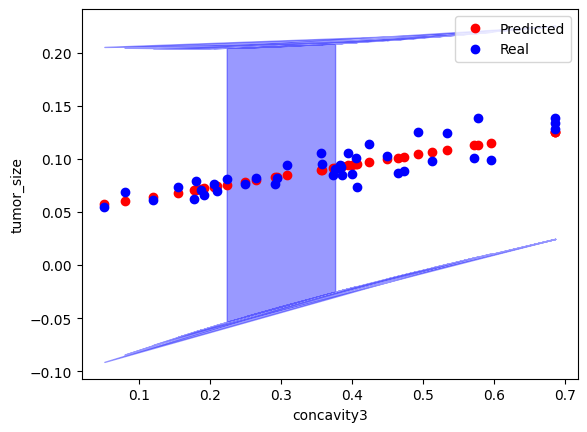

In [ ]:
from scipy.stats import t

x_test_ = x_test.to_numpy()
x_test_ = x_test_.flatten()
y_test_ = y_test.to_numpy()
y_test_ = y_test_.flatten()
y_predict_ = y_predict.flatten()

n = len(x_test_)
df = n - 1
confidence_level = 0.95
alpha = 1 - confidence_level
t_critical = t.ppf(1 - alpha / 2, df)
ci = t_critical * (np.std(y_predict_) / np.sqrt(y_predict_))

fig, ax = plt.subplots()
ax.plot(x_test_, y_predict_, 'or', label='Predicted')
ax.fill_between(x_test_, (y_predict_-ci), (y_predict_+ci), color='blue', alpha=0.4)
ax.plot(x_test, y_test_, 'ob', label='Real')
ax.legend(loc="upper right")
plt.xlabel('concavity3')
plt.ylabel('tumor_size')


### Conclusión a partir de la gráfica final

En la gráfica anterior, se visualiza el modelo lineal obtenido y la gráfica del intervalo de confianza con un nivel de confianza de 0.95. Este gráfico muestra que tanto los valores del conjunto *test* como los que *predice* el modelo cumplen con el nivel de confianza requerido y ninguno está por fuera del nivel de confianza del modelo.

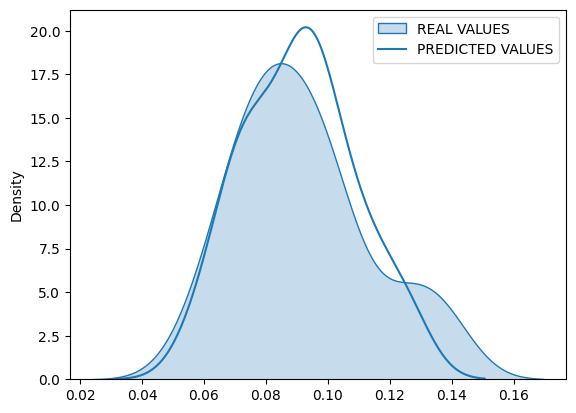

In [ ]:
# Grafico de densidad
ax = sns.kdeplot(y_test, color='red', fill=True, label='REAL VALUES')
sns.kdeplot(y_predict, color='#2ca02c', label='PREDICTED VALUES', ax=ax)
plt.legend()

### Conclusión final

De acuerdo a la gráfica de las distribuciones de la variable real y la que predice el modelo de regresión, se nota que presentan un mínimo error. Lo cual indica que las predicciones del modelo coinciden altamente con la distribución original de los datos.

## 3.4 Modelo de regresión múltple

In [ ]:
# Selección de las variables predictoras y a predecir
X_m = data_f.iloc[:, 0:8]
y_m = data_f.iloc[:, -1]
X_m.head(5)


,area1,concavity2,radius3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
0,117.50,0.014210,0.003495,0.1195,0.192600,0.3140,0.1170,0.267700
1,122.80,0.049040,0.006193,0.1622,0.665600,0.7119,0.2654,0.460100
2,137.50,0.034490,0.005039,0.1188,0.344900,0.3414,0.2032,0.433400
3,77.58,0.066134,0.007452,0.1932,0.686138,0.6869,0.2575,0.483075
4,135.10,0.024610,0.005115,0.1374,0.205000,0.4000,0.1625,0.236400


## Entrenamiento del modelo

In [ ]:
# Entrenamiento del modelo
x_train_m, x_test_m, y_train_m, y_test_m = train_test_split(X_m, y_m, test_size=0.2, shuffle = True, random_state=42)

regresion_lineal_2 = LinearRegression()
regresion_lineal_2.fit(x_train_m, y_train_m)

LinearRegression()

## 3.5 Presentación y evaluación de resultados

In [ ]:
y_predict_m = regresion_lineal_2.predict(x_test_m)

r2_m = r2_score(y_test_m, y_predict_m)
print(r2_m)

0.9482376444161522


### Conclusión a partir de R2

R2 tiene un valor de 0.95 lo cual indica que el modelo se ajusta de manera mucho más precisa que en el caso anterior. Por tanto se puede concluir que el modelo tiene un alto ajuste a los datos y la predicción del modelo será mucho más precisa.

In [ ]:
mse_m = mean_squared_error(y_true = y_test_m, y_pred = y_predict_m)
mae_m = mean_absolute_error(y_true = y_test_m, y_pred = y_predict_m)
mape_m = mean_absolute_percentage_error(y_true = y_test_m, y_pred = y_predict_m)

# La raíz cuadrada del MSE es el RMSE
rmse_m = np.sqrt(mse_m)
print('Error Cuadrático Medio (MSE) = ' + str(mse_m))
print('Raíz del Error Cuadrático Medio (RMSE) = ' + str(rmse_m))
print('Error Absoluto Medio (MAE) = ' + str(mae_m))
print('Porcentaje de Error Absoluto Medio (MAPE) = ' + str(mape_m))

Error Cuadrático Medio (MSE) = 2.353902727329334e-05
Raíz del Error Cuadrático Medio (RMSE) = 0.004851703543426096
Error Absoluto Medio (MAE) = 0.0038741840306078705
Porcentaje de Error Absoluto Medio (MAPE) = 0.04178818057869935


**Interpretación:** Los valores del MSE indican que el modelo de regresión lineal múltple es muy preciso con error cercano a cero. En promedio, las predicciones del modelo se desvían de los valores reales por 0.004 unidades.
Además el valor de MAE es de 0.004, lo cual indica que el error es cercano a cero incluso bajo presencia de valores por fuera de la distribución de los datos.

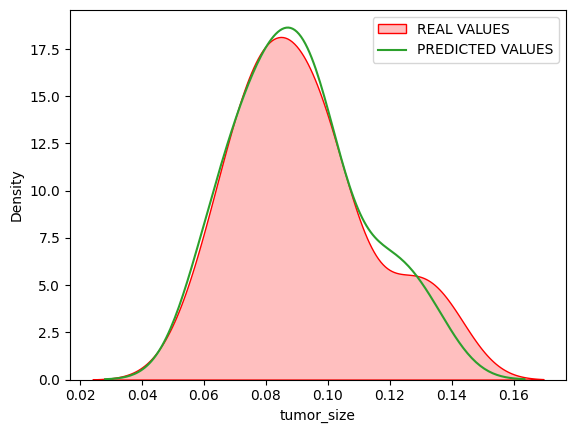

In [ ]:
# Grafico de densidad
ax = sns.kdeplot(y_test_m, color='red', fill=True, label='REAL VALUES')
sns.kdeplot(y_predict_m, color='#2ca02c', label='PREDICTED VALUES', ax=ax)
plt.legend()

### Conclusión final

De acuerdo a la gráfica de las distribuciones de la variable real y la que predice el modelo de regresión múltiple, se nota que el error en la predicción se reduce notablemente comparado con el modelo anterior.

Esto se debe a que mientras más información y con una buena calidad, el modelo es capaz de *aprender* mejor de los datos, por tanto las predicciones son más precisas.

## 3.6 Aporte al trabajo

Se ha planteado el uso de una red neuronal simple para evaluar el comportamiento del modelo comparado con los 2 casos anteriores.

In [ ]:
# Arquitectura de la Red Neuronal
from tensorflow.keras import models, layers

print(x_train_m.shape)

model_rn = models.Sequential()
# capa de entrada
model_rn.add(layers.Dense(units=16, kernel_initializer='normal', activation='relu',
                       input_shape=(8, )))
# capa intermedia
model_rn.add(layers.Dense(units=8, kernel_initializer='normal', activation='relu'))
# capa de salida
model_rn.add(layers.Dense(units=1, activation='linear'))
print(model_rn.summary())

(158, 8)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_23 (Dense)                │ (None, 16)             │           144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 289 (1.13 KB)

 Trainable params: 289 (1.13 KB)

 Non-trainable params: 0 (0.00 B)

None


### Explicación de la arquitectura anterior

Se ha definido una red neuronal para regresión de 3 capas: la **capa de entrada** tiene una entrada de 8 datos que provienen del dataset, internamente tiene 16 neuronas, la **capa intermedia** tiene 8 neuronas y en la **capa de salida** se ha definido solo una neurona, porque es la predicción de un solo valor para el parámetro de *tumor_size*. Además la activación de la capa de salida se lo hace con la función **linear**.

In [ ]:
# compilación del modelo y entrenamiento

model_rn.compile(loss='mse', optimizer='Adamax', metrics=['mse'])

model_rn.fit(x_train_m, y_train_m, epochs=50, batch_size=32, validation_split=0.1, verbose=2)

Epoch 1/50
5/5 - 1s - 259ms/step - loss: 0.4737 - mse: 0.4737 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 2/50
5/5 - 0s - 20ms/step - loss: 0.0083 - mse: 0.0083 - val_loss: 0.0168 - val_mse: 0.0168
Epoch 3/50
5/5 - 0s - 20ms/step - loss: 0.0287 - mse: 0.0287 - val_loss: 0.0319 - val_mse: 0.0319
Epoch 4/50
5/5 - 0s - 21ms/step - loss: 0.0349 - mse: 0.0349 - val_loss: 0.0228 - val_mse: 0.0228
Epoch 5/50
5/5 - 0s - 20ms/step - loss: 0.0212 - mse: 0.0212 - val_loss: 0.0091 - val_mse: 0.0091
Epoch 6/50
5/5 - 0s - 20ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 7/50
5/5 - 0s - 20ms/step - loss: 0.0015 - mse: 0.0015 - val_loss: 6.5768e-04 - val_mse: 6.5768e-04
Epoch 8/50
5/5 - 0s - 22ms/step - loss: 9.0507e-04 - mse: 9.0507e-04 - val_loss: 0.0017 - val_mse: 0.0017
Epoch 9/50
5/5 - 0s - 20ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 10/50
5/5 - 0s - 20ms/step - loss: 0.0020 - mse: 0.0020 - val_loss: 0.0020 - val_mse: 0.0020
Ep

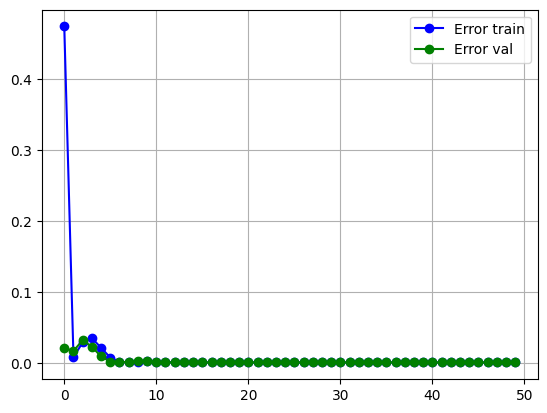

In [ ]:
# verificacion del modelo
loss_value = model_rn.history.history['loss']
val_loss = model_rn.history.history['val_loss']

plt.plot(loss_value, 'o-b', label='Error train')
plt.plot(val_loss, 'o-g', label='Error val')
plt.grid()
plt.legend()

### Interpretación de la curva

En la gráfica se muestra la métrica de error o loss durante el entrenamiento y validación del modelo. La gráfica muestra que a medida que pasan las épocas, el error entre la predicción y el valor real de validación se va reduciendo.

### Análisis e interpretación de resultados

In [ ]:
y_predict_rn = model_rn.predict(x_test_m)

r2_m = r2_score(y_test_m, y_predict_rn)
print(r2_m)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
-0.5453373730781397


### Conclusión a partir de R2

R2 tiene un valor de 0.54 lo cual indica que el modelo se ajusta de manera intermedia con los datos. Esto puede deberse a que un modelo de red neuronal requiere una cantidad considerable de datos de entrenamiento. En este caso, debido al dataset se está entrenamiendo con 198 datos, lo que pude ser insufiente para obtener un modelo robusto.

In [ ]:
mse_rn = mean_squared_error(y_true = y_test_m, y_pred = y_predict_rn)
mae_rn = mean_absolute_error(y_true = y_test_m, y_pred = y_predict_rn)
mape_rn = mean_absolute_percentage_error(y_true = y_test_m, y_pred = y_predict_rn)

# La raíz cuadrada del MSE es el RMSE
rmse_rn = np.sqrt(mse_rn)
print('Error Cuadrático Medio (MSE) = ' + str(mse_rn))
print('Raíz del Error Cuadrático Medio (RMSE) = ' + str(rmse_rn))
print('Error Absoluto Medio (MAE) = ' + str(mae_rn))
print('Porcentaje de Error Absoluto Medio (MAPE) = ' + str(mape_rn))

Error Cuadrático Medio (MSE) = 0.000702745038571558
Raíz del Error Cuadrático Medio (RMSE) = 0.026509338704908465
Error Absoluto Medio (MAE) = 0.019306665175676346
Porcentaje de Error Absoluto Medio (MAPE) = 0.20345238345800035


**Interpretación:** Los valores del MSE indican que el modelo neuronal para regresión es preciso con error cercano a cero. En promedio, las predicciones del modelo se desvían de los valores reales por 0.003 unidades.
Además el valor de MAE es de 0.02, lo cual indica que el error es cercano a cero incluso bajo presencia de valores por fuera de la distribución de los datos.

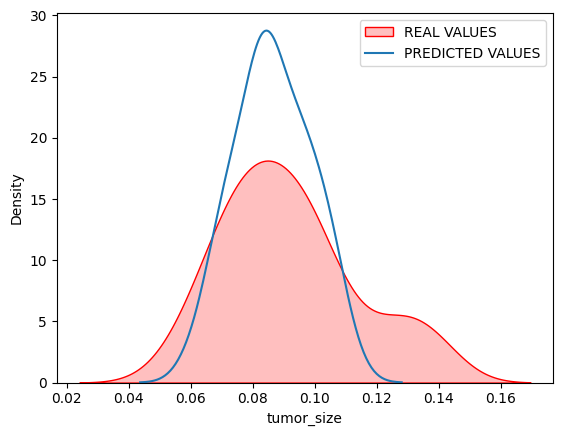

In [ ]:
# Grafico de densidad
ax = sns.kdeplot(y_test_m, color='red', fill=True, label='REAL VALUES')
sns.kdeplot(y_predict_rn, color='#2ca02c', label='PREDICTED VALUES', ax=ax)
plt.legend()

### Conclusión final y Discusión

De acuerdo a la gráfica de las distribuciones de la variable real y la que predice el modelo neuroal para regresión, se nota que las predicciones están en un distribución diferente con respecto al modelo anterior. Existe un error mayor.

- En el caso del modelo de regresión simple, los resultados obtenidos no son muy precisos en relación a la distribución de los datos reales y los predichos por el modelo. Ya que el modelo es muy simple, no puede generalizar de forma correcta para estos datos.

- En cambio el modelo de regresión múltiple, ha logrado adaptarse de manera correcta a los datos, con un alto valor para la métrica R2 y con los valores más bajos en las métricas de error. Esto puede deberse a qué los parámetros seleccionados del dataset mediante *feature engineering* son los más adecuados estadísticamente para la generación del modelo.

- El modelo de red neuronal para regresión es ineficiente para modelar los datos. Esto puede deberse a que los datos son insuficientes para entrenar un modelo de este tipo. O en su defecto, la arquitectrua de la red puede ser muy simple para este caso

**Finalmente, de acuerdo a lo analizado, el mejor modelo obtenido ha sido el modelo de regresión lineal múltiple.**

## 4. Bibliogafía

- **Dua, D., & Graff, C. (2019).** UCI Machine Learning Repository. University of California, Irvine, School of Information and Computer Sciences. UCI Machine Learning Repository
- **Duboue, P. (2020).** The art of feature engineering: Essentials for machine learning. Cambridge University Press.
- **Galli, S. (2020).** Python feature engineering cookbook: Over 70 recipes for creating, engineering, and transforming features to build machine learning models. Packt Publishing.
- **Kuhn, M., & Johnson, K. (2019).** Feature engineering and selection: A practical approach for predictive models. CRC Press.
- **Ozdemir, S. (2022).** Feature engineering bookcamp. Manning Publications.
- **Zheng, A., & Casari, A. (2018).** Feature engineering for machine learning: Principles and techniques for data scientists. O'Reilly Media.

## 5. Uso de IA

Se ha utilizado IA de manera general para consultas específicas, **NO** para creación de código ni solucionar el trabajo de forma parcial o total.